In [1]:
import pandas as pd
#pd.set_option('display.max_rows', None)
import geopandas as gpd
import matplotlib.pyplot as plt
import os
import cartopy.crs as ccrs
import cartopy
import numpy as np
import netCDF4 as nc
np.set_printoptions(threshold=100000)
from shapely.geometry import Polygon, Point, MultiPoint
from shapely.ops import cascaded_union
from datetime import datetime, timedelta

In [2]:
# load in the polygons and attributes
fire_polygons = gpd.read_file('fire_polygons_only.geojson')
fire_attributes = pd.read_csv('fire_polygons_attributes.csv')
incidents = pd.read_csv('unique_fires.csv')
incidents.iloc[1:20]

,Incident Number,Fire Name,First Day,Last Day,Lat Fire,Lon Fire
1,10662179.0,2161,2019-02-13,2019-02-14,35.221389,-101.518611
2,10662684.0,PAINTED WAGON,2019-04-08,2019-04-10,33.786944,-112.753333
3,10663171.0,LONE MOUNTAIN,2019-05-26,2019-07-03,33.808056,-105.738611
4,10663525.0,BOULDER,2019-06-05,2019-06-06,35.333056,-119.905556
5,10663618.0,PONCHO,2019-05-14,2019-05-15,33.205833,-105.227222
6,10663845.0,Channing,2019-02-16,2019-02-17,35.655339,-102.323656
7,10664053.0,Keota,2019-03-19,2019-03-20,40.684350,-103.988300
8,10664399.0,Cutacross,2019-04-05,2019-04-06,42.307222,-103.732778
9,10664535.0,Roaring,2019-06-05,2019-06-27,33.893500,-108.996000
10,10664700.0,Bugbee,2019-03-13,2019-03-16,35.749783,-101.621633


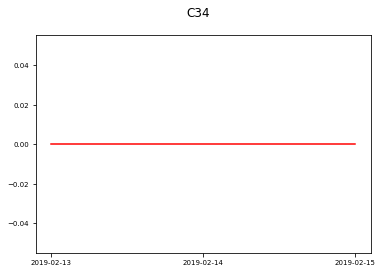

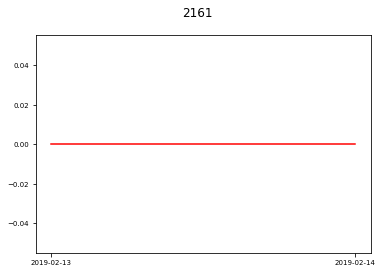

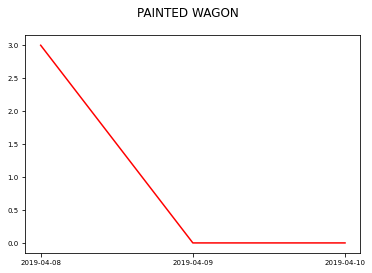

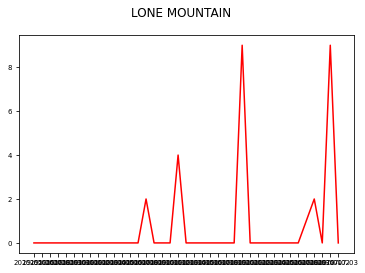

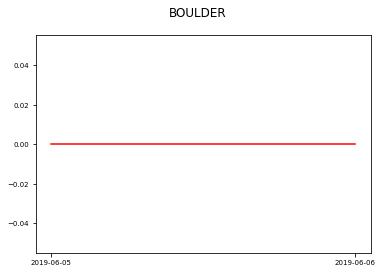

...

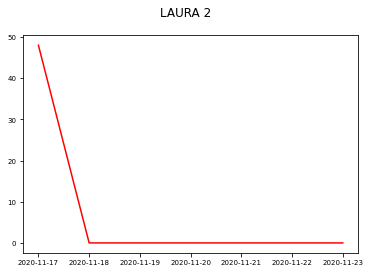

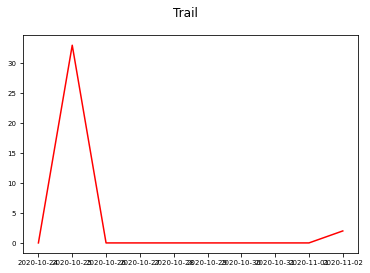

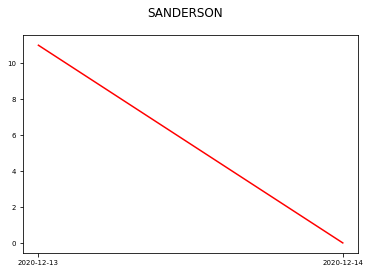

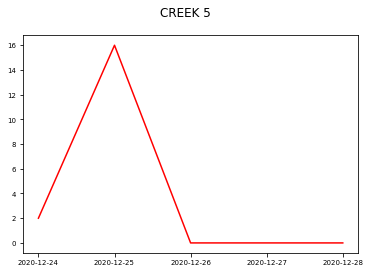

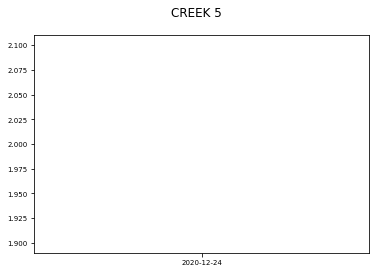

In [8]:
# plot the fire detections time series
for item in incidents['Incident Number']:
    pts = fire_attributes['Number of VIIRS points'].values[fire_attributes['Incident Number']==item]
    dys = fire_attributes['Current Day'].values[fire_attributes['Incident Number']==item]
    #areas = fire_polygons['geometry'].values[fire_attributes['Incident Number']==item].area
    #if len(pts[pts!=0])*100/len(pts)!=0:
        # Creating figure
    fig = plt.figure()
    color = 'tab:red'
    ax = fig.add_subplot(111)
    ax.plot(dys, pts, c='r')
    #ax2 = ax.twinx()
    #color = 'tab:green'
    #ax2.plot(dys,areas, c='g' )
    fig.suptitle(fire_attributes['Fire Name'].values[fire_attributes['Incident Number']==item][0])
    plt.tick_params(labelsize=7)
    plt.show()

In [11]:
test_fire_attributes =fire_attributes.loc[fire_attributes['Fire Name']=='BOULDER']
test_fire_polygons = fire_polygons.loc[fire_attributes['Fire Name']=='BOULDER']
test_fire_polygons

,geometry
47,"POLYGON ((-119.86556 35.33306, -119.86575 35.3..."
48,"POLYGON ((-119.86556 35.33306, -119.86575 35.3..."


./qfed2.emis_co2.006.20190605.nc4
<class 'netCDF4._netCDF4.Variable'>
float32 biomass(time, lat, lon)
    long_name: CO2 Biomass Emissions
    units: kg s-1 m-2
    _FillValue: 1e+20
    missing_value: 1e+20
    fmissing_value: 1e+20
    vmin: 1e+20
    vmax: 1e+20
unlimited dimensions: time
current shape = (1, 1800, 3600)
filling on
0.0018393681
[3.16184466e-07            nan]
./qfed2.emis_co2.006.20190606.nc4
<class 'netCDF4._netCDF4.Variable'>
float32 biomass(time, lat, lon)
    long_name: CO2 Biomass Emissions
    units: kg s-1 m-2
    _FillValue: 1e+20
    missing_value: 1e+20
    fmissing_value: 1e+20
    vmin: 1e+20
    vmax: 1e+20
unlimited dimensions: time
current shape = (1, 1800, 3600)
filling on
0.001318581
[3.16184466e-07 0.00000000e+00]


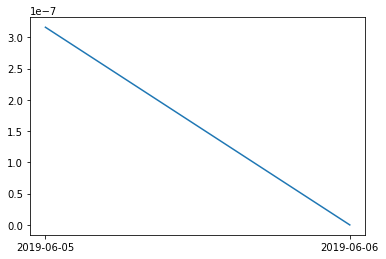

In [10]:
#TIME SERIES WITH QFED
#for each day in the fire
emiss_series = np.nan*np.zeros(len(test_fire_attributes))
for ii in range(len(test_fire_attributes)):
    day = test_fire_attributes['Current Day'].iloc[ii]
    #load in the qfed source
    filename_co2 = './qfed2.emis_co2.006.'+day[0:4]+day[5:7]+day[8:10]+'.nc4'
    print(filename_co2)
    co2 = nc.Dataset(filename_co2)
    print(co2['biomass'])
    biomass = co2['biomass'][0, :,:]
    print(np.nansum(biomass))
    lat = co2['lat'][:]
    lon = co2['lon'][:]
    co2.close()
    LON, LAT = np.meshgrid(lon, lat)
    #subset the data
    LAT, LON, biomass = subset_data(49, 31, -101, -125, LAT, LON, biomass)
    #plt.contourf(LON, LAT, biomass)
    #plt.colorbar()
    #plt.show()
    #grab the polygon
    fire_poly = test_fire_polygons.iloc[ii][0]
    #calculate the overlap between the polygon and the lat/lon grid
    overlaps = calculate_overlaps(LAT, LON, fire_poly)
    biomass_weighted = np.multiply(biomass,overlaps)
    #print(np.where(overlaps!=0))
    #print(np.where(biomass!=0))
    emiss_series[ii]=np.nansum(biomass_weighted)
    print(emiss_series)
plt.plot(test_fire_attributes['Current Day'], emiss_series)
plt.show()

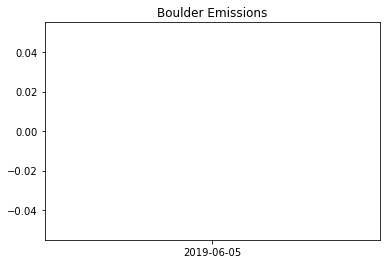

[nan nan]


In [13]:
#TIME SERIES WITH MERRA
#for each day in the fire
emiss_series = np.nan*np.zeros(len(test_fire_attributes))
for ii in range(2, len(test_fire_attributes)-4):
    day = test_fire_attributes['Current Day'].iloc[ii]
    #load in the qfed source
    filename_emiss = '/data2/lthapa/WESTUS_MERRA2_400.tavg1_2d_adg_Nx.'+day[0:4]+day[5:7]+day[8:10]+'.nc4'
    emiss = nc.Dataset(filename_emiss)
    bc = emiss['BCEMBB'][:]
    bc = np.nansum(bc, axis=0)
    lat = emiss['lat'][:]
    lon = emiss['lon'][:]
    LON, LAT = np.meshgrid(lon, lat)
    #subset the data
    LAT, LON, bc = subset_data(49, 31, -101, -125, LAT, LON, bc)

    #plt.contourf(LON, LAT, bc)
    #plt.colorbar()
    #plt.show()
    ##grab the polygon
    fire_poly = test_fire_polygons.iloc[ii][0]
    #calculate the overlap between the polygon and the lat/lon grid
    overlaps = calculate_overlaps(LAT, LON, fire_poly)
    #print(overlaps.shape)
    bc_weighted = np.multiply(bc,overlaps)
    emiss_series[ii]=np.nansum(bc_weighted)
    
plt.plot(test_fire_attributes['Current Day'], emiss_series)
plt.title('Boulder Emissions')
plt.show()
print(emiss_series)

In [ ]:
#TIME SERIES WITH GOES FRP
#for each day in the fire
emiss_series = np.nan*np.zeros(len(test_fire_attributes))
for ii in range(2, len(test_fire_attributes)-4):
    day = test_fire_attributes['Current Day'].iloc[ii]
    #load in the qfed source
    filename_emiss = '/data2/lthapa/WESTUS_MERRA2_400.tavg1_2d_adg_Nx.'+day[0:4]+day[5:7]+day[8:10]+'.nc4'
    emiss = nc.Dataset(filename_emiss)
    bc = emiss['BCEMBB'][:]
    bc = np.nansum(bc, axis=0)
    lat = emiss['lat'][:]
    lon = emiss['lon'][:]
    LON, LAT = np.meshgrid(lon, lat)
    #subset the data
    LAT, LON, bc = subset_data(49, 31, -101, -125, LAT, LON, bc)

    #plt.contourf(LON, LAT, bc)
    #plt.colorbar()
    #plt.show()
    ##grab the polygon
    fire_poly = test_fire_polygons.iloc[ii][0]
    #calculate the overlap between the polygon and the lat/lon grid
    overlaps = calculate_overlaps(LAT, LON, fire_poly)
    #print(overlaps.shape)
    bc_weighted = np.multiply(bc,overlaps)
    emiss_series[ii]=np.nansum(bc_weighted)
    
plt.plot(test_fire_attributes['Current Day'], emiss_series)
plt.title('Boulder Emissions')
plt.show()
print(emiss_series)

In [5]:
# this function calculates the overlap between the given shape (fire_shape) and given grid (LAT, LON). 
#LAT and LON should be 2D

def calculate_overlaps(LAT, LON, fire_shape):
    # find the intersection between the first day's polygon and the QFED grid
    overlaps = np.zeros(LAT.shape)
    #we will assume the very edges of the polygons don't touch the boundary of the domain
    for ii in range(1,LAT.shape[0]-1):
        for jj in range(1, LAT.shape[1]-1):
            cell_lat = LAT[ii, jj]
            cell_lon = LON[ii, jj]
            SW_lat = LAT[ii,jj] + (LAT[ii-1,jj-1] - LAT[ii,jj])/2
            SW_lon = LON[ii,jj] + (LON[ii-1,jj-1] - LON[ii,jj])/2
            SE_lat = LAT[ii,jj] + (LAT[ii-1,jj-1] - LAT[ii,jj])/2
            SE_lon = LON[ii,jj] + (LON[ii,jj] - LON[ii-1,jj-1])/2
            NW_lat = LAT[ii,jj] + (LAT[ii,jj] - LAT[ii-1,jj-1])/2
            NW_lon = LON[ii,jj] + (LON[ii-1,jj-1] - LON[ii,jj])/2
            NE_lat = LAT[ii,jj] + (LAT[ii,jj] - LAT[ii-1,jj-1])/2
            NE_lon = LON[ii,jj] + (LON[ii,jj] - LON[ii-1,jj-1])/2
            poly_cell = Polygon([(NW_lon,NW_lat), (NE_lon,NE_lat), (SE_lon,SE_lat), (SW_lon, SW_lat)])
            overlap_cell = fire_shape.intersection(poly_cell)
            overlaps[ii,jj] = overlap_cell.area/poly_cell.area
    return overlaps


In [6]:
#a function that subsets a dataset based on lat and lon
#LAT, LON, VAR are 2D matrices, bounds are numbers specified by user (31-49 lat, -125- -101 lon), 
def subset_data(nbound, sbound, ebound, wbound, LAT, LON, VAR):
    inds = np.where(((LAT>=sbound)&(LAT<=nbound)&(LON>=wbound)&(LON<=ebound)))
    nrows = len(np.unique(inds[0]))
    ncols = len(np.unique(inds[1]))
    LAT = np.reshape(LAT[inds], (nrows, ncols))
    LON = np.reshape(LON[inds], (nrows, ncols))
    VAR = np.reshape(VAR[inds], (nrows, ncols))
    return LAT, LON, VAR

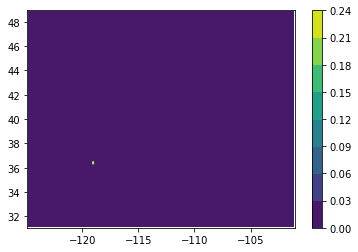

In [33]:
plt.contourf(LON, LAT, overlaps)
#plt.xlim(-112, -110)
#plt.ylim(34, 35)
plt.colorbar()
plt.show()

In [41]:
#sum up all the emissions over the day
biomass_weighted = biomass*overlaps
print(biomass_weighted[biomass_weighted!=0])

print(np.nansum(biomass_weighted))

[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan na

In [45]:
#Test the intersection function
print(type(f_poly_1[0]))
f_poly_2 = test_fire_polygons.iloc[1]
overlap = f_poly_1[0].intersection(f_poly_2[0])
print(overlap.area)

<class 'shapely.geometry.polygon.Polygon'>
1.6488407400016444e-05


./qfed2.emis_co2.006.20190618.nc4
0.00079307414


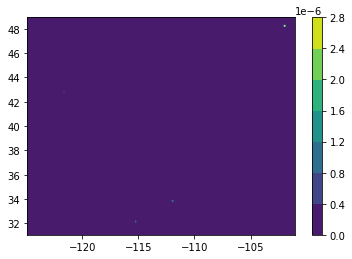

In [115]:
filename_co2 = './qfed2.emis_co2.006.20000226.nc4'
print(filename_co2)
co2 = nc.Dataset(filename_co2)
biomass = co['biomass'][0, :,:]
print(np.nansum(biomass))
lat = co['lat'][:]
lon = co['lon'][:]
co2.close()
LON, LAT = np.meshgrid(lon, lat)
#subset the data
LAT, LON, biomass = subset_data(49, 31, -101, -125, LAT, LON, biomass)
plt.contourf(LON, LAT, biomass)
plt.colorbar()
plt.show()


./qfed2.emis_co2.006.20190515.nc4
0.00079307414


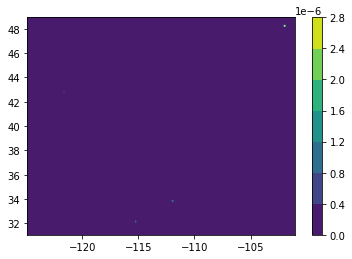

./qfed2.emis_pm25.006.20190515.nc4
0.00079307414


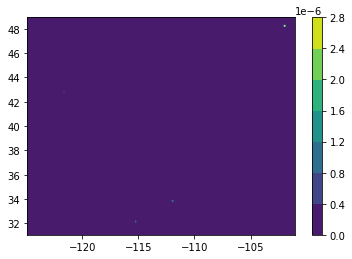

In [117]:
filename_co2 = './qfed2.emis_co2.006.20190515.nc4'
print(filename_co2)
co2 = nc.Dataset(filename_co2)
biomass = co['biomass'][0, :,:]
print(np.nansum(biomass))
lat = co['lat'][:]
lon = co['lon'][:]
co2.close()
LON, LAT = np.meshgrid(lon, lat)
#subset the data
LAT, LON, biomass = subset_data(49, 31, -101, -125, LAT, LON, biomass)
plt.contourf(LON, LAT, biomass)
plt.colorbar()
plt.show()

filename_co2 = './qfed2.emis_pm25.006.20190515.nc4'
print(filename_co2)
co2 = nc.Dataset(filename_co2)
biomass = co['biomass'][0, :,:]
print(np.nansum(biomass))
lat = co['lat'][:]
lon = co['lon'][:]
co2.close()
LON, LAT = np.meshgrid(lon, lat)
#subset the data
LAT, LON, biomass = subset_data(49, 31, -101, -125, LAT, LON, biomass)
plt.contourf(LON, LAT, biomass)
plt.colorbar()
plt.show()